# Blurring & Smoothing

There are multiple possible techniques for blurring and smoothing. Often it is combined with edge detection and edge detection algorithms can detect too mant edges when working a high res imagewithout any blurring.

Explorations in: 
- Gamma correction (making brighter or darker)
- Kernel based filters (http://setosa.io/ev/image-kernels/)



In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

### Convenience functions

In [3]:
# image loader, useful for resetting
def load_image():
    img = cv2.imread('DATA/bricks.jpg').astype(np.float32) / 255
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

In [4]:
def display_image(img):
    fig = plt.figure(figsize=(12,10))
    ax = fig.add_subplot(111)
    ax.imshow(img)

In [5]:
# print the shape info of a passed image
def info(img):
    print(img.shape)

### Loading image data

(950, 1267, 3)


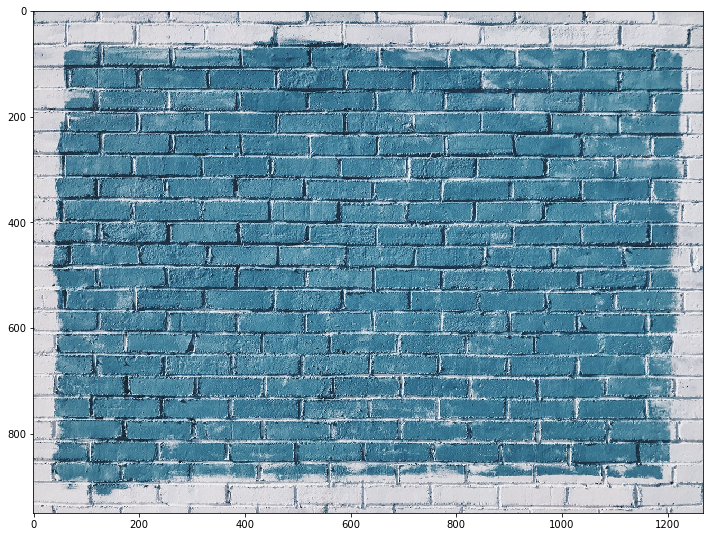

In [6]:
img = load_image()
display_image(img)
info(img)

### Applying effects to the loaded image

To change the ratio of the gamma can make the image brighter or darker depending on the gamma value. 

- `< 1` will lighten the image.
- `> 1` will darken the image

### Gamma correction

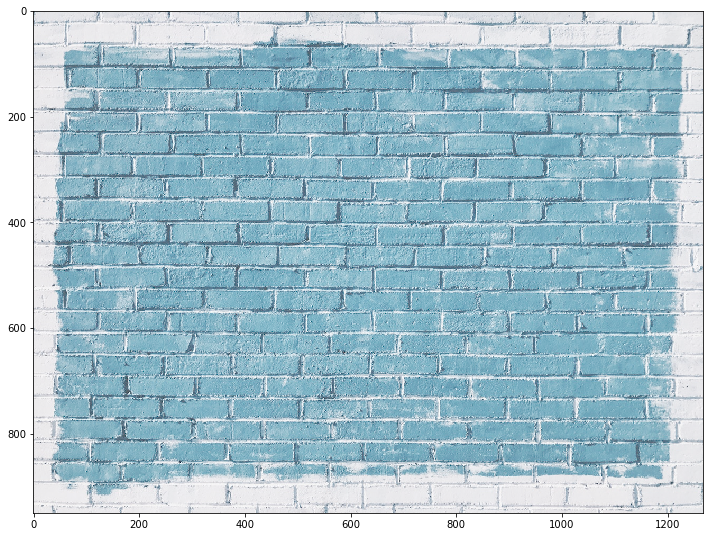

In [10]:
# set a gamm value 
# < 1 lightening. the image. > 1 will darken the image.
gamma = 1/2

# apply to the image with np.power. 
# it gets applied uniformally across 
# all the layers of the image. 
res = np.power(img, gamma)

# show the resulting image 
display_image(res)

#### Convenience image function

In [72]:
def reset_demo_image():
    img = load_image()
    font = cv2.FONT_HERSHEY_COMPLEX
    cv2.putText(img, text="OpenCV", org=(20, 580), fontFace=font, fontScale=10, color=(255,0,0), thickness=3)
    return img

### Low pass filter with 2D convolution

In order to see heightened results from blurring techniques we will write some text over the image to make the subtle differences of effects more noticable for demonstration purposes. 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


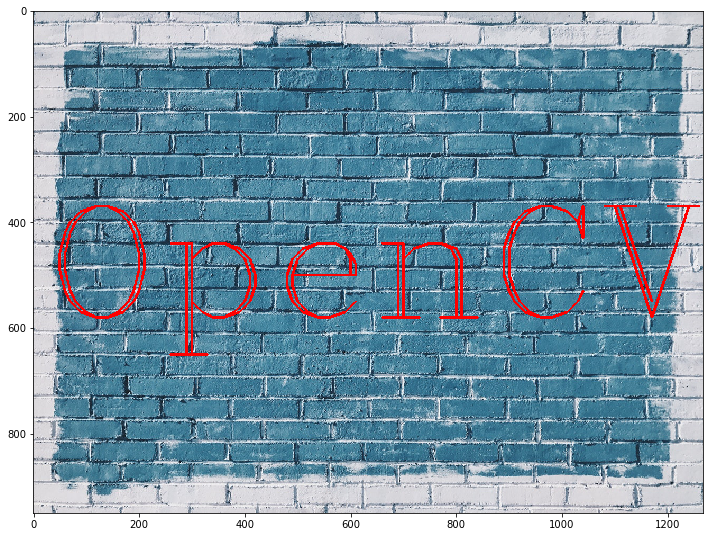

In [73]:
img = reset_demo_image()
display_image(img)

In [74]:
# create the kerne to be appied. 
kernel = np.ones(shape=(5,5), dtype=np.float32)/25

In [75]:
# check we have a 5 by 5 array of 0.04 values.
kernel

array([[0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04]], dtype=float32)

#### ddepth parameter explanation.

'Depth' is type of data of your image. Most used type is unsigned char but other data types may be used (signed char, unsigned short, signed short, int, float, double).

'Type' is combination of two separate values into one: 'depth' of image and number of channels in image. So when you provide 'type' of image to some function you actaully provide both 'depth' and number of channels.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


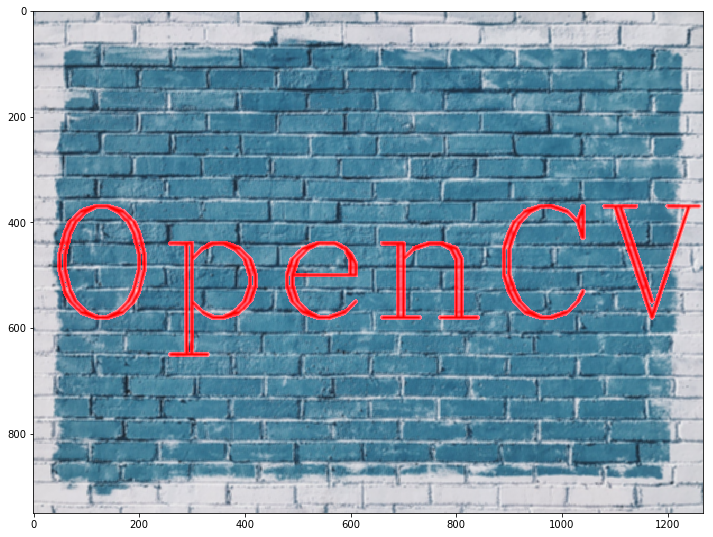

In [76]:
# create the filter, 1st aparam is the image, the 2nd param 
# is the desired depth or ddepth. (see explanation above)
# -1 means the input depth determines the output depth 
# to be the same value, so channels in equals channels out
dest = cv2.filter2D(img, -1, kernel)
display_image(dest)

### Smoothing based on averaging 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


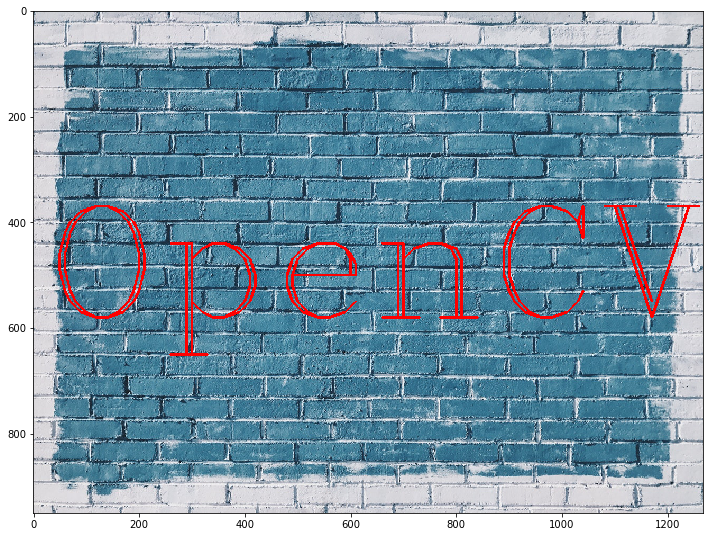

In [77]:
img = reset_demo_image()
display_image(img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


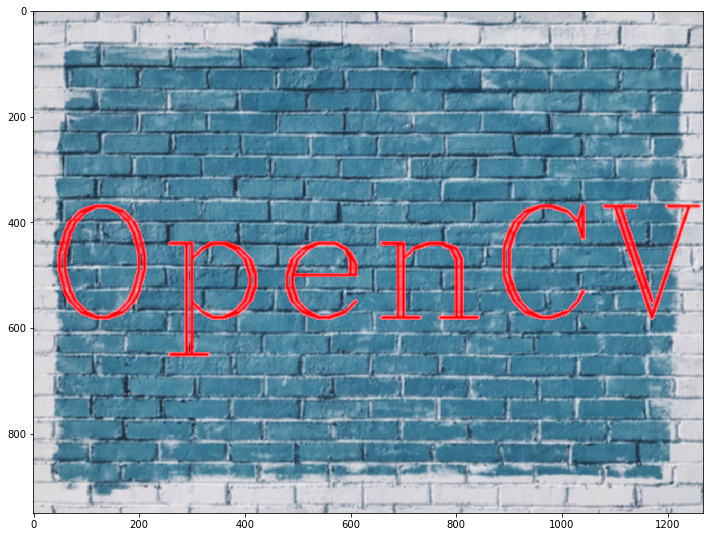

In [78]:
# apply the cv2 built-in 
blurred = cv2.blur(img, ksize=(5,5))
display_image(blurred)

### Guassian blur

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


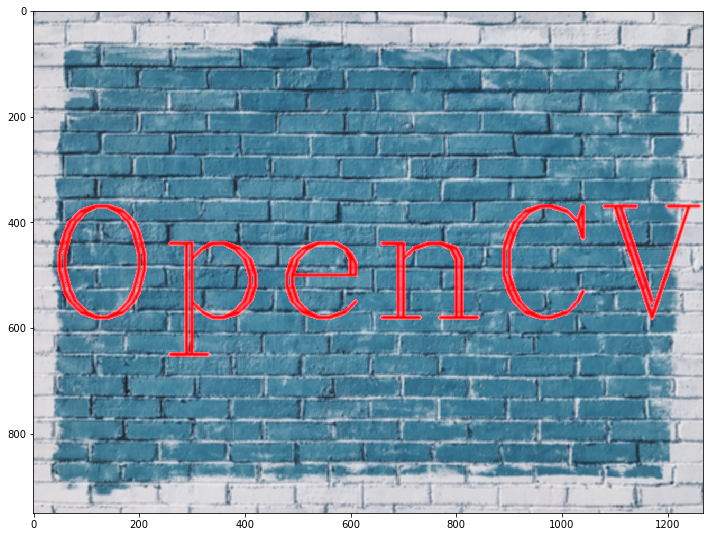

In [79]:
img = reset_demo_image()
blurred = cv2.GaussianBlur(img, (5,5), 10)
display_image(blurred)

### Built-in medianBlur

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


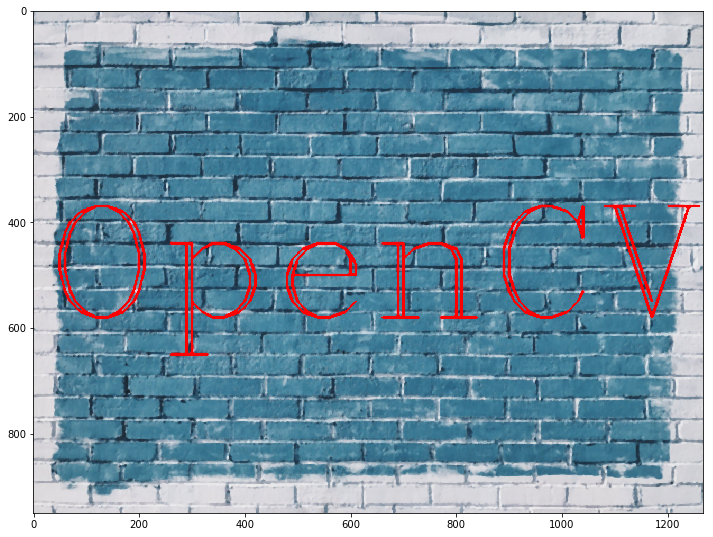

In [84]:
img = reset_demo_image()

# medianBlur takes a single int parameter as the ksize because it 
# enforces a square. Thereore in the sample the 5 is internally 
# handled as a (5,5)
blurred = cv2.medianBlur(img, 5)
display_image(blurred)


# often viewed as a good working example of emoving background 
# noise whilst not losing too much focus on details that are 
# prominent and up-front in the image. 
# In comparison to the other samples above this appears more 
# refined and preserving of detail. 

## Working Example 

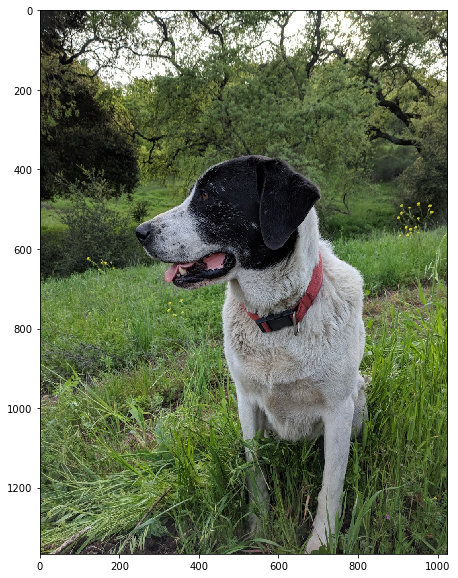

In [85]:
img = cv2.imread('DATA/sammy.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
display_image(img)


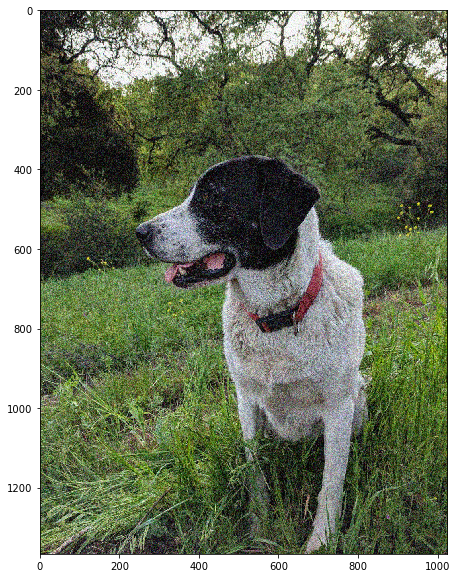

In [89]:
# load an already colour corrected, but noisy image 
noisy = cv2.imread('DATA/sammy_noise.jpg')
display_image(noisy)

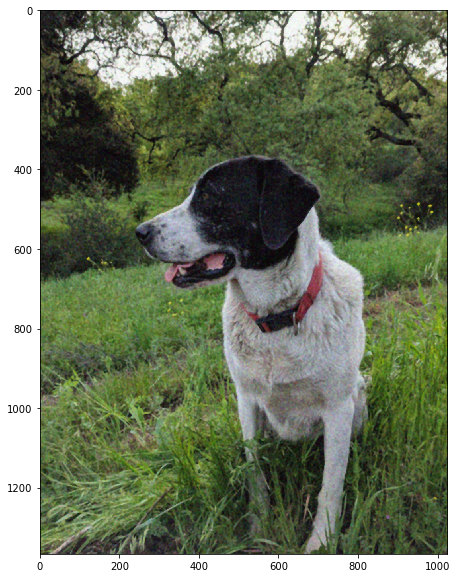

In [90]:
median = cv2.medianBlur(noisy, 5)
display_image(median)

### Bilateral filter

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


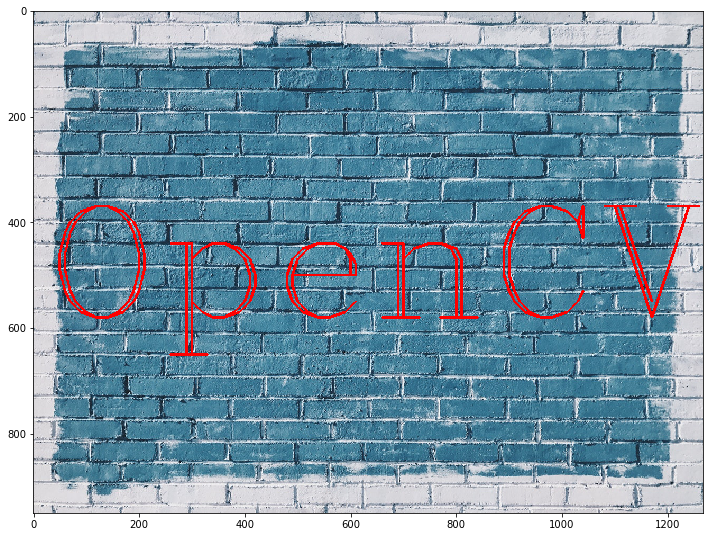

In [91]:
img = reset_demo_image()
display_image(img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


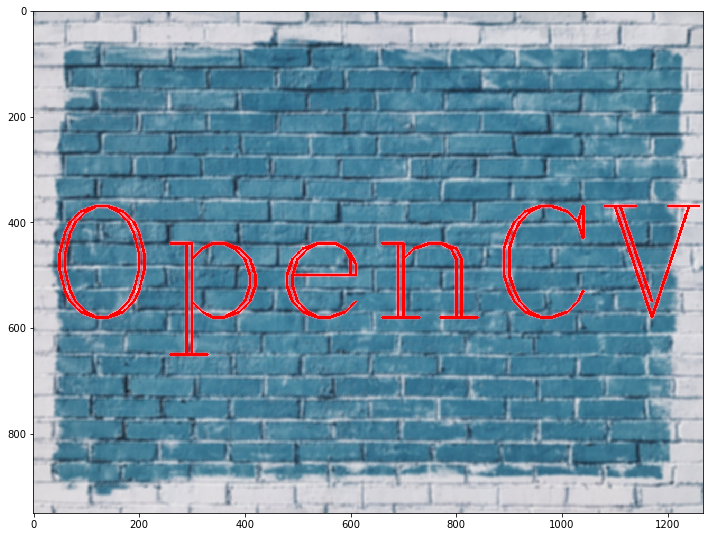

In [92]:
blurred = cv2.bilateralFilter(img, 9, 75, 75)
display_image(blurred)